# NISARQA Notebook

Helps the user run the `nisarqa` code repository against the product they are looking to analyze without having to go through all the tedious steps of running the command multiple times and editting text files every single time...

Install `nisarqa` by following the installation steps here: https://github.com/isce-framework/nisarqa

This should create the `nisarqa` conda environment and must be activatable via `conda activate nisarqa`.

Also, after creating the `nisarqa` environment, you need to activate the environment (via `conda activate nisarqa`) and then run `pip install matplotlib-inline` so that the code can work from a Jupyter Notebook (https://github.com/bmaltais/kohya_ss/issues/2521).

### You have to run the this first code cell before anything else, everything else can be ran out of order.

In [1]:
# Change this part to what you want to run the QA code against
product_type = 'gcov'
target_product_s3_url = 's3://nisar-st-data-ondemand/ALOS-1-data/20241206/GCOV/ALPSRP259530710-L1.0_GCOV.h5'

In [2]:
import os

# OPTIONAL - change where you want to put the directory where stuff gets downloaded to
output_dir = os.path.join(os.getcwd(), 'test')

# Don't touch this, it's a bunch of intermediate variables inferred from the above
target_dir = target_product_s3_url[:target_product_s3_url.rfind('/')+1]
target_basename = target_product_s3_url[target_product_s3_url.rfind('/')+1:]
target_path = os.path.join(output_dir, target_basename)

# Run `ls` on your target product's directory
This helps you make sure that you are, in fact, not crazy, and that the product is actually in the link where you specified it, and that it is accessible from this system.

In [3]:
!set -x; aws s3 ls {target_product_s3_url}
print('\n=============================================================\n')
!set -x; aws s3 ls {target_dir}

+ aws s3 ls s3://nisar-st-data-ondemand/ALOS-1-data/20241206/GCOV/ALPSRP259530710-L1.0_GCOV.h5
2024-12-07 18:05:59  234881024 ALPSRP259530710-L1.0_GCOV.h5


+ aws s3 ls s3://nisar-st-data-ondemand/ALOS-1-data/20241206/GCOV/
2024-12-07 18:11:36  230686720 ALPSRP228170790-L1.0_GCOV.h5
2024-12-07 18:11:38  234881024 ALPSRP228170800-L1.0_GCOV.h5
2024-12-07 18:11:30  243269632 ALPSRP228170810-L1.0_GCOV.h5
2024-12-07 18:11:27  243269632 ALPSRP228170820-L1.0_GCOV.h5
2024-12-07 18:11:25  230686720 ALPSRP228170830-L1.0_GCOV.h5
2024-12-07 18:11:23  192937984 ALPSRP234880730-L1.0_GCOV.h5
2024-12-07 18:11:21  188743680 ALPSRP234880740-L1.0_GCOV.h5
2024-12-07 18:11:19  209715200 ALPSRP234880750-L1.0_GCOV.h5
2024-12-07 18:11:17  230686720 ALPSRP234880760-L1.0_GCOV.h5
2024-12-07 18:11:16  239075328 ALPSRP234880770-L1.0_GCOV.h5
2024-12-07 18:11:32  230686720 ALPSRP234880780-L1.0_GCOV.h5
2024-12-07 18:08:27  205520896 ALPSRP235900670-L1.0_GCOV.h5
2024-12-07 18:08:25  234881024 ALPSRP235900680-L1.0_GCOV

# Run the QA Code
It should just work and display the image, ping me if it does not or if it does not do something you'd like it to.

Executing:
    mamba run -n nisarqa nisarqa dumpconfig gcov > /home/jovyan/alos-to-insar/test/gcov_qa_dumpconfig.yml

Executing:
    mamba run -n nisarqa nisarqa gcov_qa /home/jovyan/alos-to-insar/test/gcov_qa_final.yml

^C

CondaError: KeyboardInterrupt



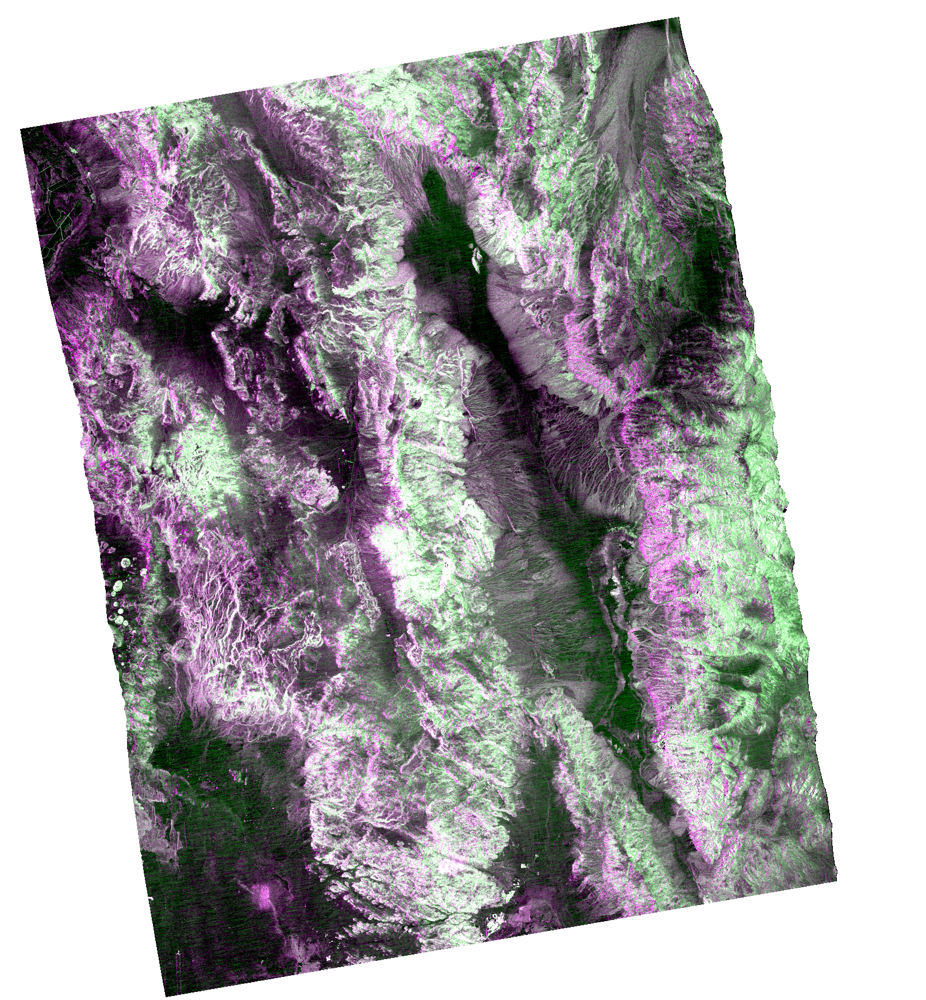

In [4]:
import os
import yaml
from PIL import Image
from IPython.display import display

# from notebook_pges.aws_uploader import AWS
import boto3
import shutil
from urllib.parse import urlparse
from botocore import UNSIGNED
from botocore.config import Config
from botocore.exceptions import ClientError

class AWS:
    """Copy-pasted AWS class from my other repository to make this notebook work by itself."""
    @staticmethod
    def download_s3(url: str, dest_file: str, cred: dict = None) -> str:
        """Download a file from an S3 URL.
        Args:
            url (str): S3 URL of input file.
            dest_file (str): Absolute file path to download towards.
            cred (dict): The credential dictionary to be passed into the boto3.client.
        Returns:
            str: relative path to the staged-in input file
        """

        # Create the parent directory if it does not exist
        os.makedirs(os.path.dirname(dest_file), exist_ok=True)

        if cred is None:
            s3 = boto3.client('s3')
        else:
            s3 = boto3.client('s3', **cred)

        # download input file
        p = urlparse(url)
        s3.download_file(p.netloc, p.path[1:], dest_file)

        return dest_file

def dumpconfig(product_type: str, target_product_path: str, output_path: str):
    """Dumps a template config and populates the path."""
    valid_product_types = ['rslc','gslc','gcov','rifg','runw','gunw','roff','goff']
    if not product_type in valid_product_types:
        raise ValueError(f'{product_type} must be one of {valid_product_types}')
    _cmd = f'mamba run -n nisarqa nisarqa dumpconfig {product_type} > {output_path}'
    print(f'Executing:\n    {_cmd}\n')
    !{_cmd}

if not os.path.exists(target_path):
    print(f'Downloading {target_path} from S3 bucket at {target_product_s3_url}...')
    AWS.download_s3(target_product_s3_url, target_path)
else:
    print(f'{target_path} already exists, skipping download...')

yml_template = os.path.join(output_dir, f'{product_type}_qa_dumpconfig.yml')
final_yml = os.path.join(output_dir, f'{product_type}_qa_final.yml')
dumpconfig(product_type, target_path, yml_template)

with open(yml_template, 'r') as f:
    template = yaml.safe_load(f)

template['runconfig']['groups']['input_file_group']['qa_input_file'] = target_path

with open(final_yml, 'w', encoding='utf-8') as f:
    yaml.dump(template, f, default_flow_style=False)


# QA locations and command
qa_image_path = os.path.join(os.getcwd(), 'qa', 'BROWSE.png')
qa_summary_path = os.path.join(os.getcwd(), 'qa', 'SUMMARY.csv')

_cmd_qa = f'mamba run -n nisarqa nisarqa {product_type}_qa {final_yml}'
print(f'Executing:\n    {_cmd_qa}\n')
!mamba run -n nisarqa nisarqa {product_type}_qa {final_yml}

# Display the image
img = Image.open(qa_image_path)
display(img)

# Prints out the Summary Table in this Notebook

In [5]:
# Print the QA summary
with open(qa_summary_path, 'r', encoding='utf-8') as f:
    for outer_loop_index, line in enumerate(f.readlines()):
        if outer_loop_index == 0:
            header = line.split(',')
            continue
        col = line.split(',')
        row_print = f'{outer_loop_index}. [{col[0].strip()}] {col[1].strip()}\n'
        for inner_loop_index, entry in enumerate(line.split(',')):
            if inner_loop_index < 2:
                continue
            row_print += f'\t- {header[inner_loop_index].strip()}: {col[inner_loop_index].strip().replace(". ", '\n\t    ')}\n'
                
        print(row_print.strip())

1. [QA] Able to open input NISAR file?
	- Result: PASS
	- Threshold: 
	- Actual: 
	- Notes:
2. [QA] QA completed with no exceptions?
	- Result: FAIL
	- Threshold: 
	- Actual: 
	- Notes:


# Display the Generated Image Again (w/o running the above code)

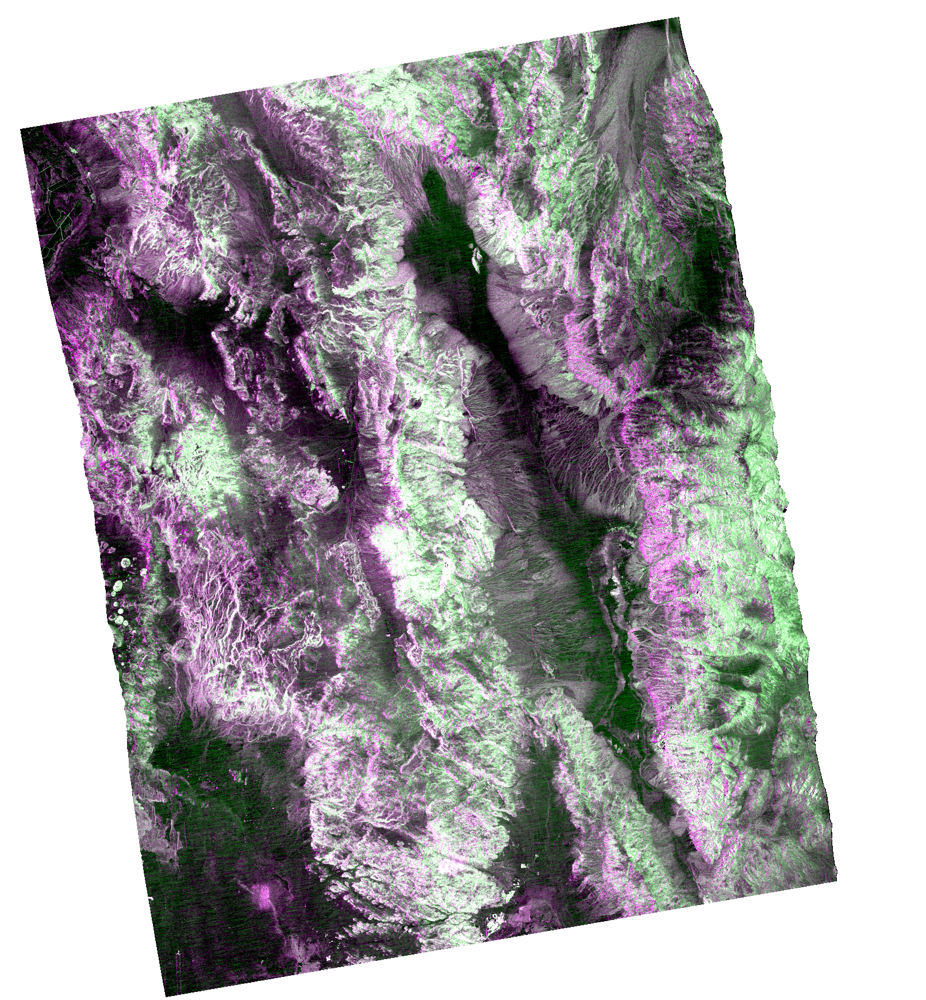

In [6]:
from PIL import Image
from IPython.display import display
img = Image.open(qa_image_path)
display(img)

# Remove the Downloaded File (for when running this notebook as a loop)

In [7]:
!rm {target_path}